# Neural Style Transfer:

## The Evolution of Art

For this assignment I have chosen Neural Style Transfer, a fairly new and interesting algorithim outlined by [Gatys, et al.(2015)](https://arxiv.org/abs/1508.06576). It does a fairly good job on describing how Deep Neural Networks have developed near-human performance object and face recognition. The article introduces an artificial system based on a Deep Neural Network that creates artistic images of high perceptual quality (simply put the network separates and recombines content and style of arbitrary images.

Neural Style Transfer is an optimization technique that transfers certain aspects of two images:

Image 1 - Usually known as the **content image**, we would want the base of our image to stay the same, discarding the 'style' of the image.

Image 2 - Known as the **style image**, this is usually a painting or some sort of image that has a very distinct style which contrasts the content image.

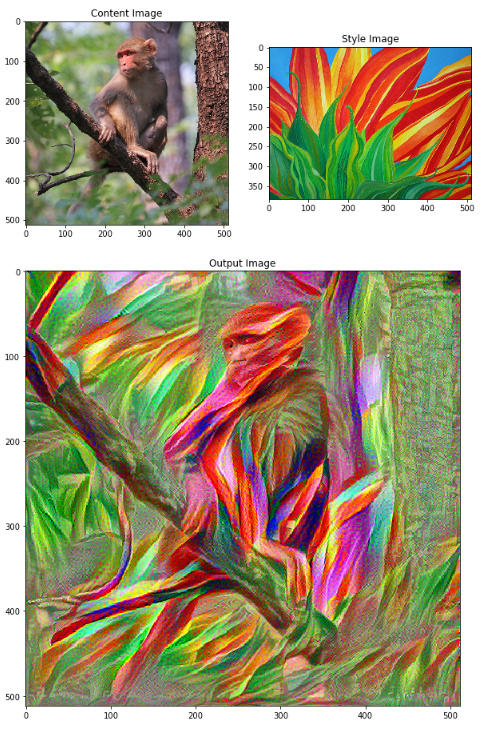

Neural Style Transfer defines two distance (loss) functions, Lcontent and Lstyle. Lcontent describes how different the two images are while Lstyle describes the difference between the two images in terms of their style. 'In this context, style essentially means textures, colors and visual patterns in the image, at various spatial scales; and the content is the higher-level macrostructure of the image.' (Chollet, 2018,*Deep Learning with Python, p,287*)

The goal of the loss function is to conserve the content of the original image while adopting the style of the reference (style) image. Mathematically speaking, the loss function to minimize would be the following

loss = 

dist(**style**(reference_image) - **style**(generated_image)) + dist(**content**(original_image) - **content**(generated_image))

## Import and configure modules

In [1]:
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (10,10)
mpl.rcParams['axes.grid'] = False

import numpy as np
from PIL import Image
import time
import functools

In [2]:
import tensorflow as tf
import tensorflow.contrib.eager as tfe

from tensorflow.python.keras.preprocessing import image as kp_image
from tensorflow.python.keras import models 
from tensorflow.python.keras import losses
from tensorflow.python.keras import layers
from tensorflow.python.keras import backend as K

## Eager Execution 

Eager execution simplifies the specification of dynamic models, it changes how TensorFlow operations behave - immediately evalue and return their values to Python. Other benefits to EE is that it allows the host language to function while the model is executing (i.e. dynamic control flow). I highly recommend to watch [this](https://www.youtube.com/watch?v=T8AW0fKP0Hs) video where Alex Passos (Software engineer on TensorFlow's Eager Execution Team) talks about it's functionality. 

In [3]:
tf.enable_eager_execution()
print("Eager execution: {}".format(tf.executing_eagerly()))

# Ensure GPU enabled
from keras import backend as K
K.tensorflow_backend._get_available_gpus()

Eager execution: True


Using TensorFlow backend.


['/job:localhost/replica:0/task:0/device:GPU:0']

In [11]:
# Set up some global values here
content_path = 'Damascus.jpg'
style_path = 'dali.jpg'

## Visualize the input

In [5]:
def load_img(path_to_img):
  max_dim = 512
  img = Image.open(path_to_img)
  long = max(img.size)
  scale = max_dim/long
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)
  
  img = kp_image.img_to_array(img)
  
  # broadcast the image array such that it has a batch dimension 
  img = np.expand_dims(img, axis=0)
  return img

In [6]:
def imshow(img, title=None):
  # Remove the batch dimension
  out = np.squeeze(img, axis=0)
  # Normalize for display 
  out = out.astype('uint8')
  plt.imshow(out)
  if title is not None:
    plt.title(title)
  plt.imshow(out)

*Content and style images* 

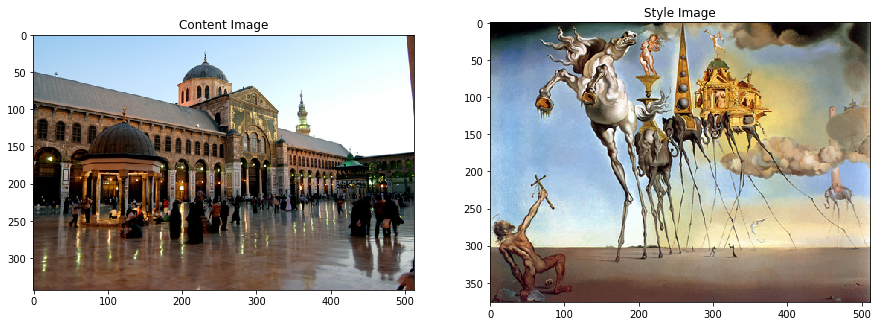

In [12]:
plt.figure(figsize=(15,15))

content = load_img(content_path).astype('uint8')
style = load_img(style_path).astype('uint8')

plt.subplot(1, 2, 1)
imshow(content, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style, 'Style Image')
plt.show()

## Prepare the data

We will be using VGG19, a pretrained model developed by University of Oxford's [Visual Geometry Group](http://www.robots.ox.ac.uk/~vgg/). The network is 19 layers deep and can classify images into 1000 object categories, such as keyboard, mouse, pencil, and many animals. As a result, the network has learned rich feature representations for a wide range of images. The VGG19 network takes 3 input images as input - the image containing the targeted content, the style reference image and a placeholder containing the generated image.

In [13]:
def load_and_process_img(path_to_img):
  img = load_img(path_to_img)
  img = tf.keras.applications.vgg19.preprocess_input(img)
  return img

Inverse preprocessing is required to view outputs of optimization. For further clarification, image ppreprocessing usually entails data such as pixel distribtuion, geometric transformations, etc.). By deprocessing the image we are stripping away unwanted data and retrieving pure RAW format of the file, in this case it would be deprocessed to the point where content and style layers are exposed. A great read on image pre-processing is available [online](https://pdfs.semanticscholar.org/cc43/a71e05cfc49ab0777b82ca94d181f779149f.pdf) written by Jules Verne, highly recommended.

In [14]:
def deprocess_img(processed_img):
  x = processed_img.copy()
  if len(x.shape) == 4:
    x = np.squeeze(x, 0)
  assert len(x.shape) == 3, ("Input to deprocess image must be an image of "
                             "dimension [1, height, width, channel] or [height, width, channel]")
  if len(x.shape) != 3:
    raise ValueError("Invalid input to deprocessing image")
  
  # perform the inverse of the preprocessiing step
  x[:, :, 0] += 103.939
  x[:, :, 1] += 116.779
  x[:, :, 2] += 123.68
  x = x[:, :, ::-1]

  x = np.clip(x, 0, 255).astype('uint8')
  return x

## Intermediate layers

Intermediate layers are required for our pretrained network to define style and content representations. In the content image, the best option is to obtain the feature representation of the highest layers, since they contain information on the image macrostructure. While for the style reference image, feature representations are obtained from multiple layers at different scales. This allows the convnet to spot invariances and differentiate between content and style within an image.

In [15]:
# Content layer where will pull our feature maps
content_layers = ['block5_conv2'] 

# Style layer we are interested in
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1'
               ]

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

## Building the model

Once layers are developed, load [VGG19](https://keras.io/applications/#vgg19) and provide the input tensors to the model. That will allow to extract activation (feature) maps which will subsequently extract the content and style representation of input and output images. According to Raymond Yuan that developed [this](https://medium.com/tensorflow/neural-style-transfer-creating-art-with-deep-learning-using-tf-keras-and-eager-execution-7d541ac31398) piece of code, the VGG19 model is the best. It is relatively simple compared with ResNet,Inception and other image classification models. 

Benchmarks for certain convultional neural network models can be found [here](https://github.com/jcjohnson/cnn-benchmarks). *(Note to self - purchase a new GPU!!!!)*

***

## Functional API

The model will be utilising the functional API - it allows the user to create models that have a lot more flexibility and can easily define models where layers connect to more than just the previous and next layers (Sequential). Due to having two inputs (content and style reference images) we are not able to use Sequential and therefore will have to use Functional API.

*Reason to avoid utlitising Sequential API - It is limited in that it does not allow you to create models that share layers or have multiple inputs or outputs, this can lead to problems succh as representational bottlenecks *(DLWP Ch.7.1.4, Chollet, 2018)*

In [16]:
def get_model():
  """ Creates our model with access to intermediate layers. 
  
  This function will load the VGG19 model and access the intermediate layers. 
  These layers will then be used to create a new model that will take input image
  and return the outputs from these intermediate layers from the VGG model. 
  
  Returns:
    returns a keras model that takes image inputs and outputs the style and 
      content intermediate layers. 
    """    
  # Load our model. We load pretrained VGG, trained on imagenet data
  vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False
  # Get output layers corresponding to style and content layers 
  style_outputs = [vgg.get_layer(name).output for name in style_layers]
  content_outputs = [vgg.get_layer(name).output for name in content_layers]
  model_outputs = style_outputs + content_outputs
  # Build model 
  return models.Model(vgg.input, model_outputs)

The code found in cell above loads the pretrained image classification network VGG19. Then create a model that takes input image and outputs the content and style layers.

## Loss Functions

### Content Loss

The activations of different layers of a convnet provide a decomposition of the contents of an image over different spatial scales. The content of an image is captured by the representation of the upper layers in a convnetFocusing on a single upper layer that holds global abstract information of the image. 
[L2 normalisation](https://stats.stackexchange.com/questions/331926/explain-meaning-and-purpose-of-l2-normalization)  activations of an upper layer in a pretrained convnet that is computed between the target and generated images. (Chollet, 2018, *Deep learning with Python, p.288*)

In [17]:
def get_content_loss(base_content, target):
  return tf.reduce_mean(tf.square(base_content - target))

### Style Loss
The content loss only uses a single upper layer, however the style loss defined by Gatys et al. uses multiple layers of a convnet: capturing the appearance of style reference image at all spatial scales extracted by the convnet. For the style loss the [Gram matrix](http://mathworld.wolfram.com/GramMatrix.html) is used: It maps the correlations between the layer's features which capture the statistics of the patterns of the spatial scale.
In short, preserving style of the style reference image to generated (result) image is done by maintaing similar correlations within activations for both low level and high-level layers. Feature correlations capture **textures**: both images should share same textures at different spatial scales.

In [18]:
def gram_matrix(input_tensor):
  # We make the image channels first 
  channels = int(input_tensor.shape[-1])
  a = tf.reshape(input_tensor, [-1, channels])
  n = tf.shape(a)[0]
  gram = tf.matmul(a, a, transpose_a=True)
  return gram / tf.cast(n, tf.float32)

def get_style_loss(base_style, gram_target):
  """Expects two images of dimension h, w, c"""
  # height, width, num filters of each layer
  # We scale the loss at a given layer by the size of the feature map and the number of filters
  height, width, channels = base_style.get_shape().as_list()
  gram_style = gram_matrix(base_style)
  
  return tf.reduce_mean(tf.square(gram_style - gram_target))# / (4. * (channels ** 2) * (width * height) ** 2)

## Run Gradient Descent
In this project I'll be using the Adam optimizer to minimise the loss. Instead of updating weights in the network, train the input image (this is done by calculating loss and gradients).

Please note that I have used Adam instead of L-BFGS optimizer, due to applying eager execution earlier on. **L-BFGS (short for [Broyden-Fletcher-Goldfarb-Shanno](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.HessianUpdateStrategy.html#scipy.optimize.HessianUpdateStrategy)  does a better job at generating art however it leaves a high GPU memory footprint**, could cause jupyter notebooks to malfunction). Tuning the Adam optimizer has fixed some low res issues, for more information on how this was done check jcjohnson's GitHub profile [here](https://github.com/jcjohnson/neural-style/wiki/Fine-Tuning-The-Adam-Optimizer)

In [19]:
def get_feature_representations(model, content_path, style_path):
  """Helper function to compute our content and style feature representations.

  This function will simply load and preprocess both the content and style 
  images from their path. Then it will feed them through the network to obtain
  the outputs of the intermediate layers. 
  
  Arguments:
    model: The model that we are using.
    content_path: The path to the content image.
    style_path: The path to the style image
    
  Returns:
    returns the style features and the content features. 
  """
  # Load our images in 
  content_image = load_and_process_img(content_path)
  style_image = load_and_process_img(style_path)
  
  # batch compute content and style features
  style_outputs = model(style_image)
  content_outputs = model(content_image)
  
  
  # Get the style and content feature representations from our model  
  style_features = [style_layer[0] for style_layer in style_outputs[:num_style_layers]]
  content_features = [content_layer[0] for content_layer in content_outputs[num_style_layers:]]
  return style_features, content_features

## Compute the loss

In [20]:
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
  """This function will compute the loss total loss.
  
  Arguments:
    model: The model that will give us access to the intermediate layers
    loss_weights: The weights of each contribution of each loss function. 
      (style weight, content weight, and total variation weight)
    init_image: Our initial base image. This image is what we are updating with 
      our optimization process. We apply the gradients wrt the loss we are 
      calculating to this image.
    gram_style_features: Precomputed gram matrices corresponding to the 
      defined style layers of interest.
    content_features: Precomputed outputs from defined content layers of 
      interest.
      
  Returns:
    returns the total loss, style loss, content loss, and total variational loss
  """
  style_weight, content_weight = loss_weights
  
  # Feed our init image through our model. This will give us the content and 
  # style representations at our desired layers. Since we're using eager
  # our model is callable just like any other function!
  model_outputs = model(init_image)
  
  style_output_features = model_outputs[:num_style_layers]
  content_output_features = model_outputs[num_style_layers:]
  
  style_score = 0
  content_score = 0

  # Accumulate style losses from all layers
  # Here, we equally weight each contribution of each loss layer
  weight_per_style_layer = 1.0 / float(num_style_layers)
  for target_style, comb_style in zip(gram_style_features, style_output_features):
    style_score += weight_per_style_layer * get_style_loss(comb_style[0], target_style)
    
  # Accumulate content losses from all layers 
  weight_per_content_layer = 1.0 / float(num_content_layers)
  for target_content, comb_content in zip(content_features, content_output_features):
    content_score += weight_per_content_layer* get_content_loss(comb_content[0], target_content)
  
  style_score *= style_weight
  content_score *= content_weight

  # Get total loss
  loss = style_score + content_score 
  return loss, style_score, content_score

## Compute the gradients

tf.GradientTape is part of Eager Execution. TensorFlow provides the tf.GradientTape API for automatic differentiation - computing the gradient of a computation with respect to its input variables. Tensorflow "records" all operations executed inside the context of a tf.GradientTape onto a "tape". Tensorflow then uses that tape and the gradients associated with each recorded operation to compute the gradients of a "recorded" computation using reverse mode differentiation.

In [21]:
def compute_grads(cfg):
  with tf.GradientTape() as tape: 
    all_loss = compute_loss(**cfg)
  # Compute gradients wrt input image
  total_loss = all_loss[0]
  return tape.gradient(total_loss, cfg['init_image']), all_loss

## Apply and run style transfer

In [43]:
import IPython.display

def run_style_transfer(content_path, 
                       style_path,
                       num_iterations=100,
                       content_weight=1e3, 
                       style_weight=1e-2): 
  # We don't need to (or want to) train any layers of our model, so we set their
  # trainable to false. 
  model = get_model() 
  for layer in model.layers:
    layer.trainable = False
  
  # Get the style and content feature representations (from our specified intermediate layers) 
  style_features, content_features = get_feature_representations(model, content_path, style_path)
  gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]
  
  # Set initial image
  init_image = load_and_process_img(content_path)
  init_image = tfe.Variable(init_image, dtype=tf.float32)
  # Create our optimizer
  opt = tf.train.AdamOptimizer(learning_rate=5, beta1=0.99, epsilon=1e-1)

  # For displaying intermediate images 
  iter_count = 1
  
  # Store our best result
  best_loss, best_img = float('inf'), None
  
  # Create a nice config 
  loss_weights = (style_weight, content_weight)
  cfg = {
      'model': model,
      'loss_weights': loss_weights,
      'init_image': init_image,
      'gram_style_features': gram_style_features,
      'content_features': content_features
  }
    
  # For displaying
  num_rows = 2
  num_cols = 5
  display_interval = num_iterations/(num_rows*num_cols)
  start_time = time.time()
  global_start = time.time()
  
  norm_means = np.array([103.939, 116.779, 123.68])
  min_vals = -norm_means
  max_vals = 255 - norm_means   
  
  imgs = []
  for i in range(num_iterations):
    grads, all_loss = compute_grads(cfg)
    loss, style_score, content_score = all_loss
    opt.apply_gradients([(grads, init_image)])
    clipped = tf.clip_by_value(init_image, min_vals, max_vals)
    init_image.assign(clipped)
    end_time = time.time() 
    
    if loss < best_loss:
      # Update best loss and best image from total loss. 
      best_loss = loss
      best_img = deprocess_img(init_image.numpy())

    if i % display_interval== 0:
      
      # Use the .numpy() method to get the concrete numpy array
      plot_img = init_image.numpy()
      plot_img = deprocess_img(plot_img)
      imgs.append(plot_img)
      IPython.display.clear_output(wait=True)
      IPython.display.display_png(Image.fromarray(plot_img))
      print('Iteration: {}'.format(i))        
      print('Total loss: {:.4e}, ' 
            'style loss: {:.4e}, '
            'content loss: {:.4e}, '
            'time: {:.4f}s'.format(loss, style_score, content_score, time.time() - start_time))
  print('Total time: {:.4f}s'.format(time.time() - global_start))
  IPython.display.clear_output(wait=True)
  plt.figure(figsize=(14,4))
  for i,img in enumerate(imgs):
      plt.subplot(num_rows,num_cols,i+1)
      plt.imshow(img)
      plt.xticks([])
      plt.yticks([])
      end_time = time.time()
      duration = (end_time - start_time)
      print("duration: " + str(duration))
  return best_img, best_loss

Function to show results of images

In [41]:
def show_results(best_img, content_path, style_path, show_large_final=True):
  plt.figure(figsize=(10, 5))
  content = load_img(content_path) 
  style = load_img(style_path)

  plt.subplot(1, 2, 1)
  imshow(content, 'Content Image')

  plt.subplot(1, 2, 2)
  imshow(style, 'Style Image')

  if show_large_final: 
    plt.figure(figsize=(10, 10))

    plt.imshow(best_img)
    plt.title('Output Image')
    plt.show()


## Difference in final image by tweaking content and style weights

5 images with different content and style-reference weight combinations were produced to note if there were any key differences. All 5 images used the same content and style-reference images, content is set to one of Goldsmiths most iconic buildings while the style-reference image is a painting made by Picasso

    1.default params (content_weight=1e3, style_weight=1e-2)
    2.Content weight (default), Style weight increased (le-2 to le2)
    3.Content weight increased (le3 to le6), style weight (default)
    4.Content weight (default), style weight decreased (1e-2 to 1e-5) 
        *least amount of noise, entire structural design intact
    5.Content weight decreased (le3 to le-2), style weight (default)  
        *Most vibrant colours, loss of structure clearly visible

### Goldsmiths - Picasso 

#### 1. default params (content_weight=1e3, style_weight=1e-2)

duration: 28.422131299972534
duration: 28.438128232955933
duration: 28.45511507987976
duration: 28.47008228302002
duration: 28.48607850074768
duration: 28.50206232070923
duration: 28.519044399261475
duration: 28.534029722213745
duration: 28.55001425743103
duration: 28.56600546836853


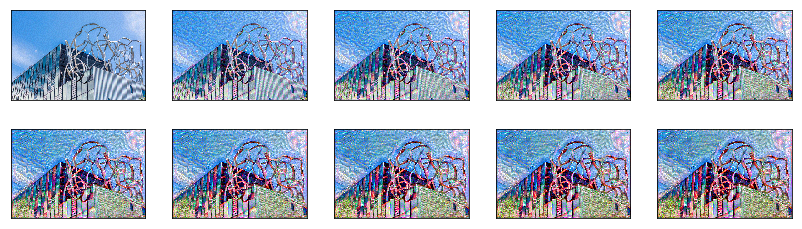

In [25]:
best_goldsmiths_picasso_1, best_loss = run_style_transfer('gold2.jpg','picasso.jpg')

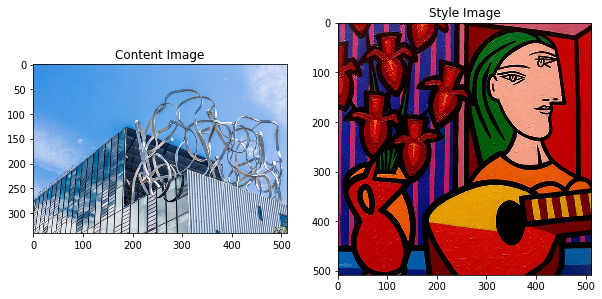

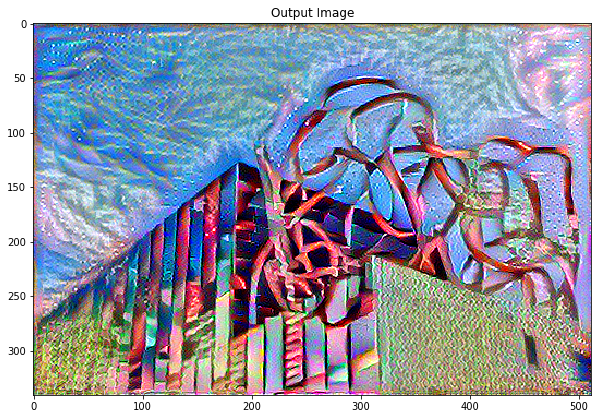

In [26]:
show_results(best_goldsmiths_picasso_1,'gold2.jpg','picasso.jpg')

#### 2.  Content weight (default), Style weight increased (le-2 to le2)

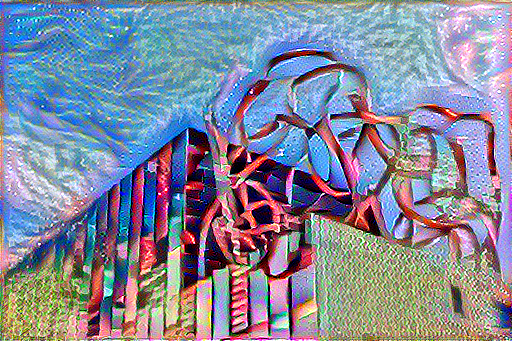

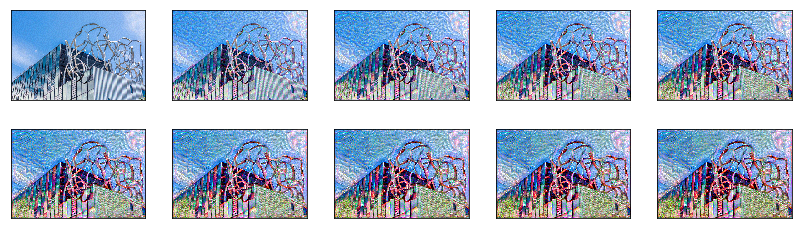

In [61]:
best_goldsmiths_picasso_2, best_loss = run_style_transfer('gold2.jpg',
             'picasso.jpg')

# Parameters: num_iterations=100, content_weight=1e3, style_weight=1e2)
Image.fromarray(best_goldsmiths_picasso_2)

#### 3. Content weight increased (le3 to le6), style weight (default)

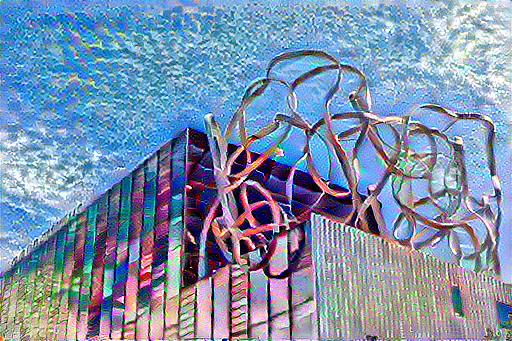

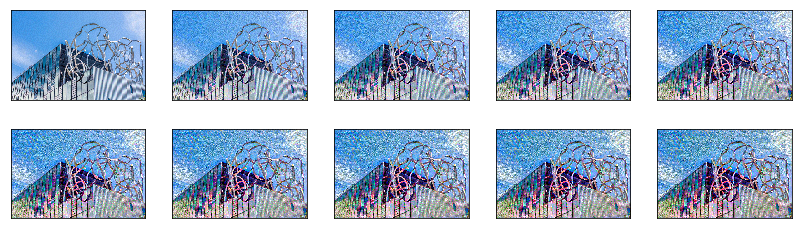

In [63]:
best_goldsmiths_picasso_3, best_loss = run_style_transfer('gold2.jpg',
             'picasso.jpg')

# Parameters: num_iterations=100, content_weight=1e6, style_weight=1e-2)
Image.fromarray(best_goldsmiths_picasso_3)

#### 4.  Content weight (default), style weight decreased (1e-2 to 1e-5)

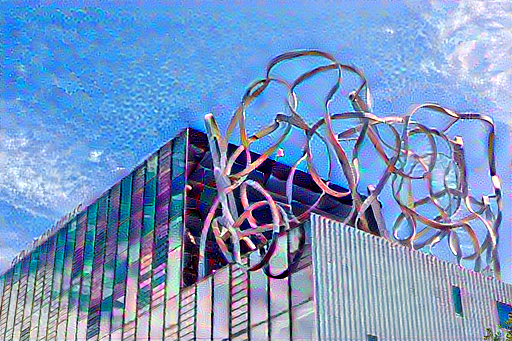

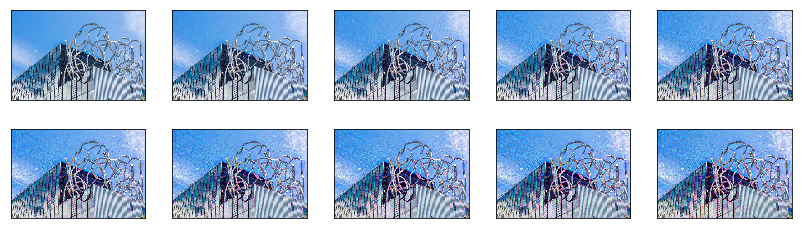

In [65]:
best_goldsmiths_picasso_4, best_loss = run_style_transfer('gold2.jpg',
             'picasso.jpg')

# Parameters: num_iterations=100, content_weight=1e3, style_weight=1e-5)
Image.fromarray(best_goldsmiths_picasso_4)

#### 5. Content weight decreased (le3 to le-2), style weight (default)

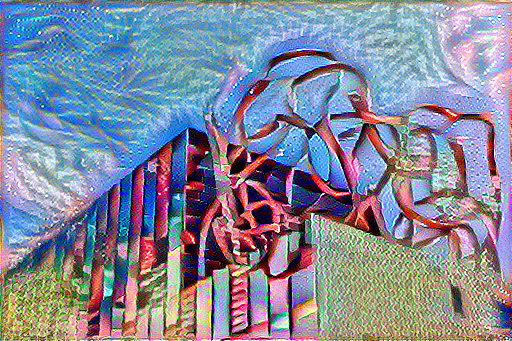

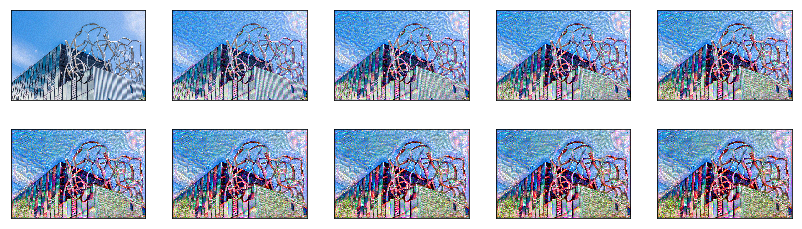

In [67]:
best_goldsmiths_picasso_5, best_loss = run_style_transfer('gold2.jpg',
             'picasso.jpg')

# Parameters: num_iterations=100, content_weight=1e-2, style_weight=1e-2)
Image.fromarray(best_goldsmiths_picasso_5)

### Green Fire Monkey

This is an example showing that not all resulting images have content and style images blend well together. Factors such as colour scheme and texture play a big part in accomplishing style transfer.

duration: 40.806710720062256
duration: 40.82768797874451
duration: 40.85066509246826
duration: 40.86964535713196
duration: 40.890623569488525
duration: 40.90960454940796
duration: 40.92958378791809
duration: 40.94956350326538
duration: 40.97154188156128
duration: 40.993518352508545


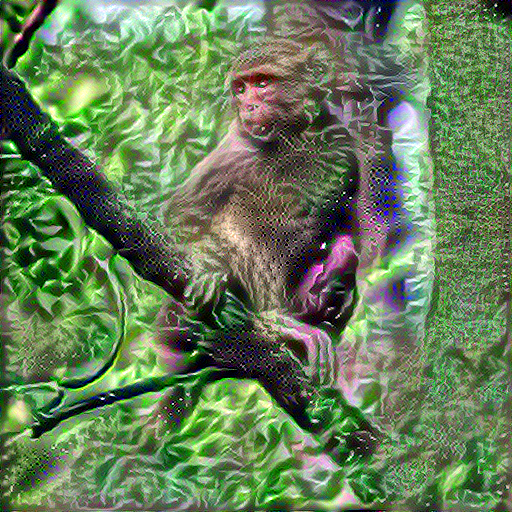

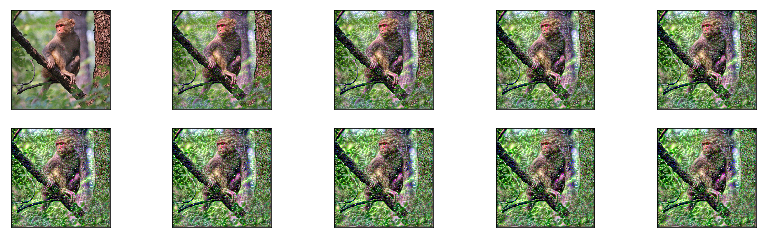

In [27]:
best_monkey_fire, best_loss = run_style_transfer('monkey.jpg','greenfire.jpg')

Image.fromarray(best_monkey_fire)

## Flower Monkey! (personal favourite)

duration: 38.71583795547485
duration: 38.735817670822144
duration: 38.755797386169434
duration: 38.775776863098145
duration: 38.794757604599
duration: 38.81473708152771
duration: 38.833717823028564
duration: 38.853697299957275
duration: 38.87367796897888
duration: 38.89565467834473


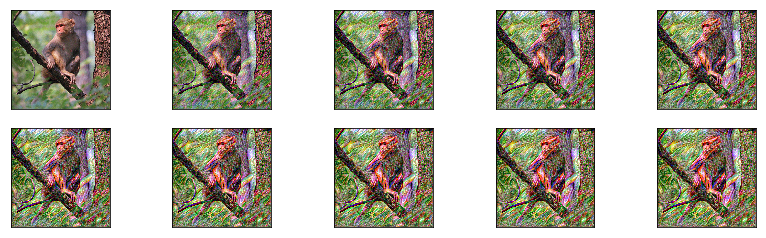

In [32]:
best_flower_monkey, best_loss = run_style_transfer('monkey.jpg','flower.jpg')

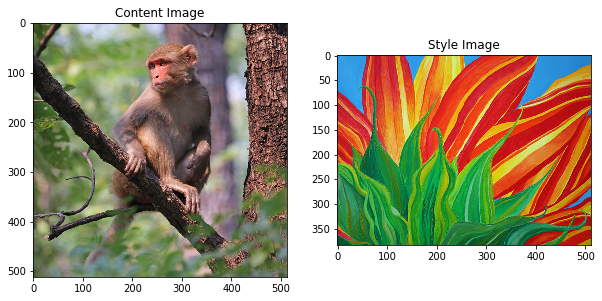

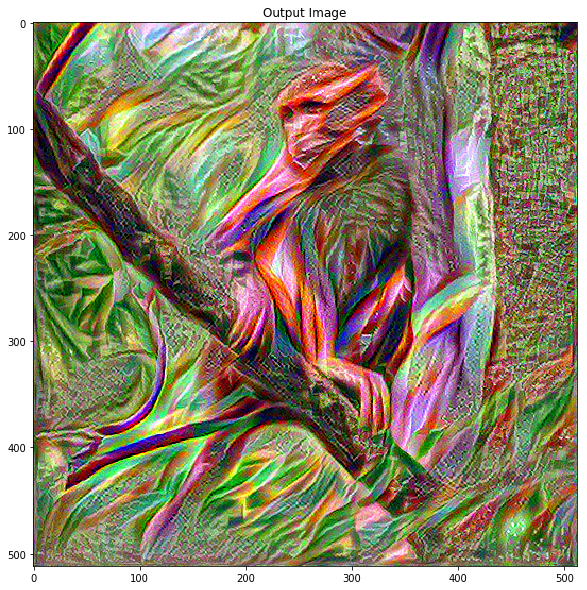

In [33]:
show_results(best_flower_monkey,'monkey.jpg','flower.jpg')

## Eroded Empire (Aleppo Citadel)

duration: 24.404059171676636
duration: 24.42104148864746
duration: 24.436039209365845
duration: 24.451010942459106
duration: 24.465009927749634
duration: 24.47899556159973
duration: 24.492981433868408
duration: 24.507965803146362
duration: 24.52195143699646
duration: 24.53793501853943


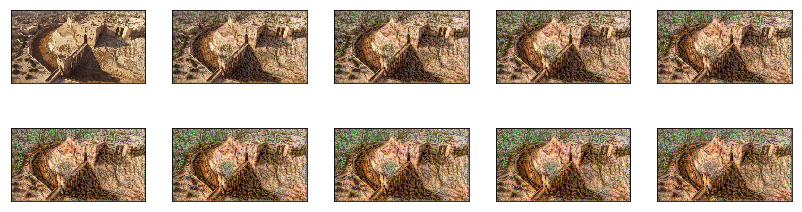

In [35]:
best_aleppo_wood, best_loss = run_style_transfer('aleppo2.jpg','wood.jpg')

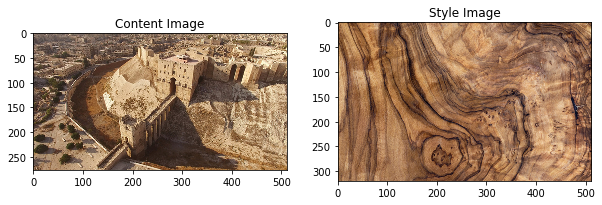

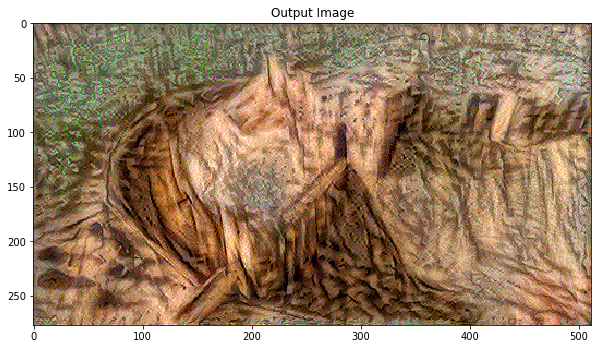

In [36]:
show_results(best_aleppo_wood,'aleppo2.jpg','wood.jpg')

## Patterned Parliament

duration: 27.91030740737915
duration: 27.92729425430298
duration: 27.943273544311523
duration: 27.960256576538086
duration: 27.97724413871765
duration: 27.992223739624023
duration: 28.008207321166992
duration: 28.024195909500122
duration: 28.040161848068237
duration: 28.058143138885498


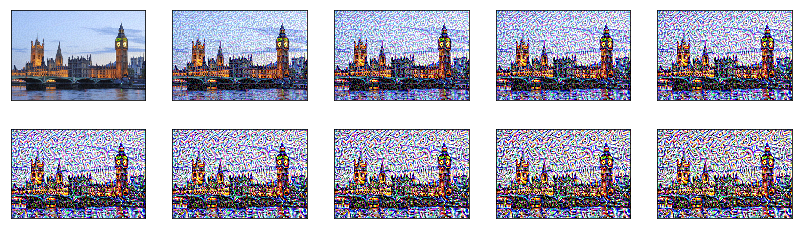

In [37]:
best_london_yellow, best_loss = run_style_transfer('london.jpg','yellow-.jpg')

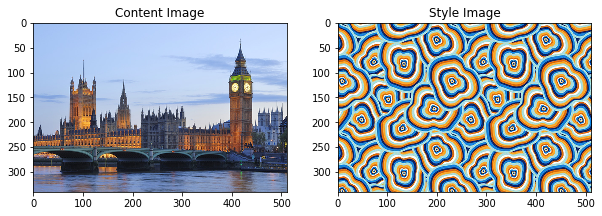

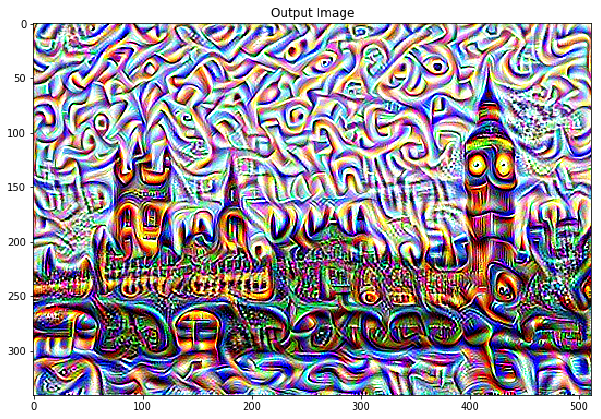

In [38]:
show_results(best_london_yellow,'london.jpg','yellow-.jpg')

***

## VGG19 vs VGG16

Below you will find two identical images, one run by VGG19 the other VGG16. Both have been tested on same parameters (100 iterations with same content and loss weights. Both running Adam optimizer with equal rates, however not only do they produce different visuals but one is actually faster than the other, which is VGG16 in this case. Findings correspond to findings in this [article](https://medium.com/coinmonks/paper-review-of-vggnet-1st-runner-up-of-ilsvlc-2014-image-classification-d02355543a11) written by SH Tsang. The reason why VGG16 might be faster than VGG19 is due to its depth and number of fully-connected nodes, 533MB for VGG16 and 574MB for VGG19.

duration: 29.053122758865356
duration: 29.07010555267334
duration: 29.087100505828857
duration: 29.104088306427002
duration: 29.12007188796997
duration: 29.136050939559937
duration: 29.152034759521484
duration: 29.168018341064453
duration: 29.184002161026
duration: 29.199986457824707


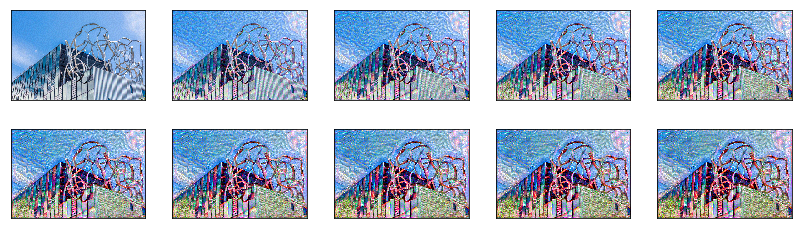

In [25]:
# VGG19 (double-click below to view duration spent on each batch. Batch: 10 iterations, 100 total)
best_goldsmiths_picasso_1, best_loss = run_style_transfer('gold2.jpg','picasso.jpg')

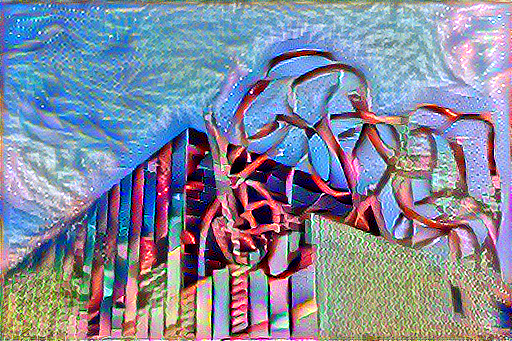

In [26]:
Image.fromarray(best_goldsmiths_picasso_1)

duration: 25.496543645858765
duration: 25.51451587677002
duration: 25.531498432159424
duration: 25.548467874526978
duration: 25.564451932907104
duration: 25.581448316574097
duration: 25.596433877944946
duration: 25.61341428756714
duration: 25.62839961051941
duration: 25.7642605304718


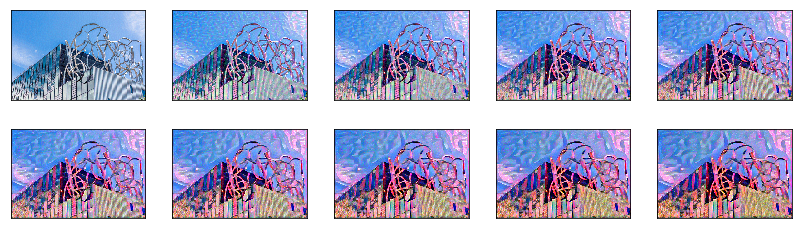

In [65]:
# VGG16 (double-click below to view duration spent on each batch. Batch: 10 iterations, 100 total)
best_goldsmiths_picasso_VGG16, best_loss = run_style_transfer('gold2.jpg','picasso.jpg')
Image.fromarray(best_goldsmiths_picasso_VGG19)

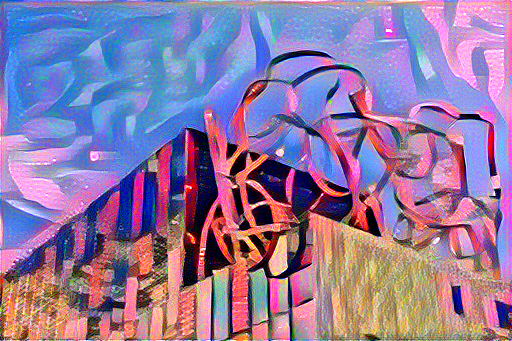

In [80]:
# VGG16 model
best_goldsmiths_picasso_VGG16, best_loss = run_style_transfer('gold2.jpg','picasso.jpg')
Image.fromarray(best_goldsmiths_picasso_VGG16)

## GIF

Looking for online literature I had come across the implementation of Neural Style Transfer on [Videos](https://medium.com/element-ai-research-lab/stabilizing-neural-style-transfer-for-video-62675e203e42). That's when I got the idea to create a GIF and apply style to it, however this was not possible due to the limitations of my current system's GPU. Albeit I managed to compile photos I had taken at home, ran the algorithim through 10 jpg files then compiled them into a single GIF file using GIMP. Here's me giving the thumbs up some with my favourite art piece in the background. :)

Hope you enjoyed reading this report! 

That's a wrap! 👍👍👍

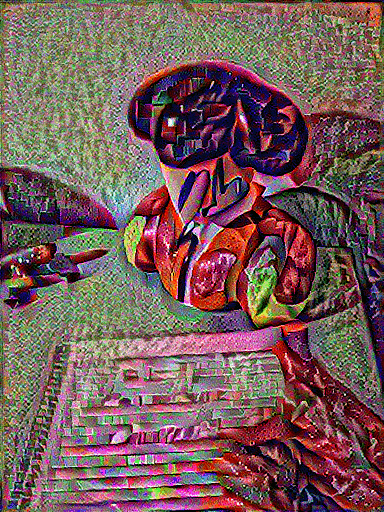